In [1]:
import os
import random
import numpy as np
from pathlib import Path
import pandas as pd
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision.utils import make_grid
import albumentations as A
from albumentations.pytorch import ToTensorV2
# import wandb
# import torchmetrics
from torchvision.models import inception_v3
from scipy.stats import entropy
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from scipy.linalg import sqrtm
from torchvision.utils import make_grid

In [2]:
!pip install wandb

In [2]:
TRAIN_SKETCH_PATH_PAIRED = "/kaggle/input/gan-assignment/Assignment_4/Train/Paired_train_sketches/Paired_train_sketches"
TRAIN_DATA_PATH = "/kaggle/input/gan-assignment/Assignment_4/Train/Train_data/Train_data"
TRAIN_DATA_CSV_PATH = "/kaggle/input/gan-assignment/Assignment_4/Train/Train_labels.csv"

In [3]:
TEST_SKETCH_PATH_PAIRED = "/kaggle/input/gan-assignment/Assignment_4/Test/Paired_test_sketch/Paired_test_sketch"
TEST_DATA_PATH = "/kaggle/input/gan-assignment/Assignment_4/Test/Test_data/Test_data"
TEST_DATA_CSV_PATH = "/kaggle/input/gan-assignment/Assignment_4/Test/Test_labels.csv"

In [4]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
SKETCH_WIDTH = 128
SKETCH_HEIGHT = 128
BATCH_SIZE = 32
NUM_WORKERS = 2
DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"

In [5]:
DEVICE

'cpu'

In [6]:
def find_class(one_hot_vec):
    for i, x in enumerate(one_hot_vec):
        if x == 1:
            return i

In [7]:
def plot_augmentations(img, img_augmented, sketch_img, sketch_img_augmented):
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        axes[0].imshow(img)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        axes[1].imshow(img_augmented.permute(1, 2, 0))
        axes[1].set_title('Augmented Image')
        axes[1].axis('off')

        axes[2].imshow(sketch_img)
        axes[2].set_title('Original Sketch')
        axes[2].axis('off')

        axes[3].imshow(sketch_img_augmented.permute(1, 2, 0))
        axes[3].set_title('Augmented Sketch')
        axes[3].axis('off')

        plt.show()

In [8]:
def plot_transformations(img, sketch_img, transform_img):
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        axes = axes.ravel()

        # Plot the original image and sketch
        axes[0].imshow(img)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        axes[5].imshow(sketch_img)
        axes[5].set_title('Original Sketch')
        axes[5].axis('off')

        # Apply and plot each transformation
        if self.transform_img:
            for i, transform in enumerate(transform_img.transforms):
                transformed_img = transform(image=img)['image']
                transformed_sketch_img = transform(image=sketch_img)['image']
                axes[i+1].imshow(transformed_img)
                axes[i+1].set_title(f'Transformed Image {i+1}')
                axes[i+1].axis('off')
                axes[i+6].imshow(transformed_sketch_img)
                axes[i+6].set_title(f'Transformed Sketch {i+1}')
                axes[i+6].axis('off')

        plt.tight_layout()
        plt.show()

In [9]:
class CustomDataset(Dataset):
  def __init__(self, img_path, sketch_path, csv_data_frame_path, transform_img=None, transform_sketch=None):
    self.img_dir = img_path
    self.sketch_dir = sketch_path
    self.data_frame = pd.read_csv(csv_data_frame_path)
    self.transform_img = transform_img
    self.transform_sketch = transform_sketch
    self.sketch_images = os.listdir(sketch_path)

  def __len__(self):
    return len(self.data_frame)

  def __getitem__(self, idx):
    img_name = os.path.join(self.img_dir, self.data_frame.iloc[idx, 0])
    img = Image.open(img_name + '.jpg').convert('RGB')
    label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
    img_class = find_class(label)
    
    sketch_file_name = os.path.join(self.sketch_dir, self.data_frame.iloc[idx, 0] + '_segmentation.png')
    sketch_img = Image.open(sketch_file_name).convert('RGB')

#     random_index = random.randint(0, len(self.sketch_images) - 1)
#     sketch_name = self.sketch_images[random_index]
#     sketch_img = Image.open(self.sketch_dir + '/' + sketch_name).convert('RGB')

    if self.transform_img:
        img_np = np.array(img)
        sketch_img_np = np.array(sketch_img)
#         print(img.shape, sketch_img.shape)
        augmented = self.transform_img(image=img_np, mask=sketch_img_np)
        img = augmented['image']
        sketch_img = augmented['mask']
        sketch_img = sketch_img.permute(2, 0, 1)
#         print(img.shape, sketch_img.shape)
#         img = self.transform_img(img)
#         if idx == 1:
#             print(img_np.shape, sketch_img_np.shape)
#             self.plot_transformations(img_np, sketch_img_np, self.transform_img)

#     if self.transform_sketch:
#       sketch_img = self.transform_sketch(sketch_img)

    return img, label, sketch_img, img_class
    
  def plot_transformations(self, img, sketch_img, transform_img):
        num_transforms = len(transform_img.transforms) if transform_img else 0
        num_rows = 2
        num_cols = min(num_transforms + 1, 6)  
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols, 8))
        axes = axes.ravel()

        # Plot the original image and sketch
        axes[0].imshow(img)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        axes[5].imshow(sketch_img)
        axes[5].set_title('Original Sketch')
        axes[5].axis('off')

        # Apply and plot each transformation
        if transform_img:
            for i, transform in enumerate(transform_img.transforms):
                transformed_img = transform(image=img, mask=sketch_img)
#                 transformed_sketch_img = transform(image=sketch_img)['image']
                axes[i+1].imshow(transformed_img['image'])
                axes[i+1].set_title(f'Transformed Image {i+1}')
                axes[i+1].axis('off')
                axes[i+7].imshow(transformed_img['mask'])
                axes[i+7].set_title(f'Transformed Sketch {i+1}')
                axes[i+7].axis('off')

        plt.tight_layout()
        plt.show()

In [10]:
class CustomDataLoader:
  def __init__(self):
    pass

  def setup(self):
#     transform_img = transforms.Compose([
#         transforms.Resize((IMG_WIDTH, IMG_HEIGHT)),
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
#     ])
    transform_img = A.Compose([
        A.Resize(IMG_WIDTH, IMG_HEIGHT),
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
        A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ])
    
    transform_img_test = A.Compose([
        A.Resize(IMG_WIDTH, IMG_HEIGHT),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ])

#     transform_sketch = transforms.Compose([
#         transforms.Resize((SKETCH_WIDTH, SKETCH_HEIGHT)),
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
#     ])

    self.train_dataset = CustomDataset(TRAIN_DATA_PATH, TRAIN_SKETCH_PATH_PAIRED, TRAIN_DATA_CSV_PATH, transform_img, transform_sketch=None)
    self.test_dataset = CustomDataset(TEST_DATA_PATH, TEST_SKETCH_PATH_PAIRED, TEST_DATA_CSV_PATH, transform_img=transform_img_test, transform_sketch=None)

  def train_dataloader(self):
    return DataLoader(self.train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

  def test_dataloader(self):
    return DataLoader(self.test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

  def compute_variance(self):
    # Collect data from the dataset into a tensor on the GPU
    data_tensor = torch.tensor([]).to(DEVICE)  # Initialize an empty tensor on the GPU
    for sample in self.train_dataset:
        # Assuming each sample is a tuple (image, label)
        data_tensor = torch.cat((data_tensor, sample[0].unsqueeze(0).to(DEVICE)), dim=0)  # Append image tensor and transfer to GPU
    
    # Compute the variance on the GPU
    x_train_var = torch.var(data_tensor, dim=(0, 2, 3))  # Compute variance across channels and spatial dimensions
    return x_train_var

In [11]:
data_loader = CustomDataLoader()
data_loader.setup()

/tmp/ipykernel_34/1421869563.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


(450, 600, 3) (450, 600, 3)


IndexError: index 12 is out of bounds for axis 0 with size 12

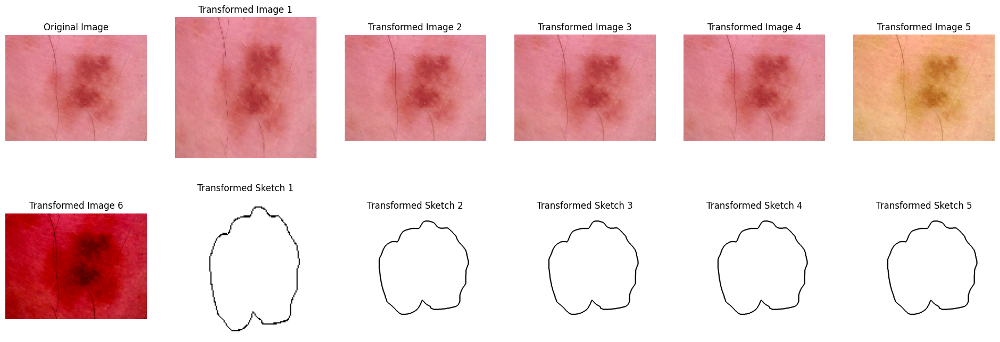

In [273]:
img, _, _, _ = data_loader.train_dataset[1]
# data_loader.train_dataset.plot_augmentations(img)

In [11]:
x_train_var = data_loader.compute_variance()

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


In [ ]:
x_train_var

In [13]:
x_train_var = torch.tensor([0.1383, 0.1683, 0.1863])
x_train_var

tensor([0.1383, 0.1683, 0.1863])

In [289]:
images, labels, sketches, classes = next(iter(data_loader.train_dataloader()))

/tmp/ipykernel_34/3806081156.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/3806081156.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


In [15]:
print(images.shape, labels.shape, sketches.shape, classes.shape)

torch.Size([32, 3, 128, 128]) torch.Size([32, 7]) torch.Size([32, 3, 128, 128]) torch.Size([32])


In [65]:
images, labels, sketches, classes = next(iter(data_loader.test_dataloader()))

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


In [16]:
def display_image(image):
  pil_image = transforms.functional.to_pil_image(image)
  plt.figure(figsize=(8, 8))
  plt.imshow(pil_image, cmap='gray')
  plt.title('Sample Image')
  plt.axis('off')
  plt.show()

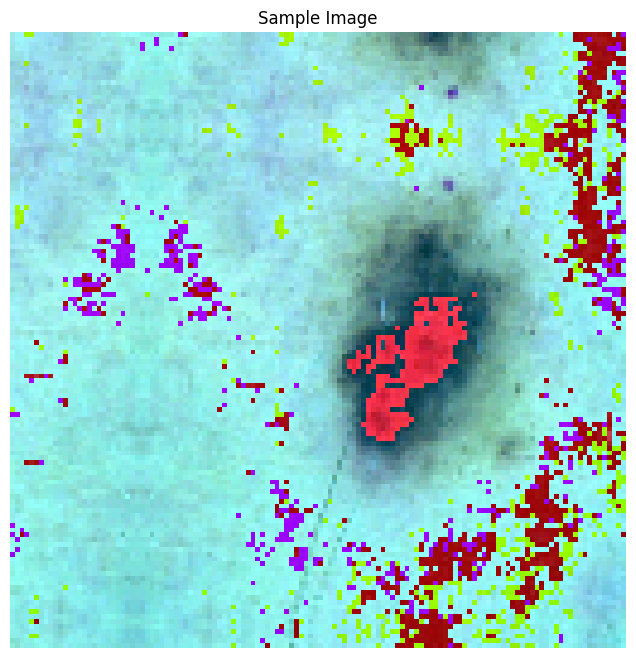

In [17]:
display_image(images[5])

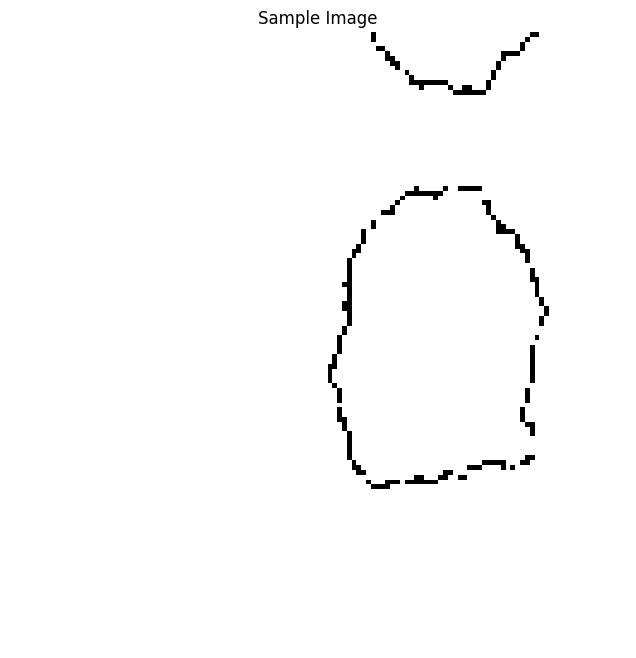

In [18]:
display_image(sketches[5])

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(segmented_image_bgr_d)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(downsampled_image_bgr_k_means)
plt.title('Segmented Image')
plt.axis('off')

In [12]:
class ResidualLayer(nn.Module):
    """
    One residual layer inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    """

    def __init__(self, in_dim, h_dim, res_h_dim):
        super(ResidualLayer, self).__init__()
        self.res_block = nn.Sequential(
            nn.ReLU(True),
            nn.Conv2d(in_dim, res_h_dim, kernel_size=3,
                      stride=1, padding=1, bias=False),
            nn.ReLU(True),
            nn.Conv2d(res_h_dim, h_dim, kernel_size=1,
                      stride=1, bias=False)
        )

    def forward(self, x):
#         print("r", x.shape)
        x = x + self.res_block(x)
#         print("r2", x.shape)
        return x

In [13]:
class ResidualStack(nn.Module):
    """
    A stack of residual layers inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    - n_res_layers : number of layers to stack
    """

    def __init__(self, in_dim, h_dim, res_h_dim, n_res_layers):
        super(ResidualStack, self).__init__()
        self.n_res_layers = n_res_layers
        self.stack = nn.ModuleList(
            [ResidualLayer(in_dim, h_dim, res_h_dim)]*n_res_layers)

    def forward(self, x):
#         print("rs", x.shape)
        for layer in self.stack:
            x = layer(x)
#             print("rs2", x.shape)
        x = F.relu(x)
#         print("rs3", x.shape)
        return x

In [14]:
x = np.random.random_sample((3, 40, 40, 200))
x = torch.tensor(x).float()
# test Residual Layer
res = ResidualLayer(40, 40, 20)
res_out = res(x)
print('Res Layer out shape:', res_out.shape)
# test res stack
res_stack = ResidualStack(40, 40, 20, 3)
res_stack_out = res_stack(x)
print('Res Stack out shape:', res_stack_out.shape)

Res Layer out shape: torch.Size([3, 40, 40, 200])
Res Stack out shape: torch.Size([3, 40, 40, 200])


In [15]:
class Encoder(nn.Module):
    """
    This is the q_theta (z|x) network. Given a data sample x q_theta 
    maps to the latent space x -> z.

    For a VQ VAE, q_theta outputs parameters of a categorical distribution.

    Inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    - n_res_layers : number of layers to stack

    """

    def __init__(self, in_dim, h_dim, n_res_layers, res_h_dim):
        super(Encoder, self).__init__()
        kernel = 4
        stride = 2
        self.conv_stack = nn.Sequential(
           nn.Conv2d(in_dim, h_dim // 2, kernel_size=kernel,
                      stride=stride, padding=1),
            nn.ReLU(),
            nn.Conv2d(h_dim // 2, h_dim, kernel_size=kernel,
                      stride=stride, padding=1),
            nn.ReLU(),
            nn.Conv2d(h_dim, h_dim, kernel_size=kernel-1,
                      stride=stride-1, padding=1),
            ResidualStack(h_dim, h_dim, res_h_dim, n_res_layers)
        )

    def forward(self, x):
#         print(x.shape)
        for layer in self.conv_stack:
            x = layer(x)
#             print(x.shape)
        return x
        return self.conv_stack(x)

In [72]:
x = np.random.random_sample((32, 3, 128, 128))
x = torch.tensor(x).float().to(DEVICE)

# test encoder
encoder = Encoder(3, 128, 5, 64).to(DEVICE)
encoder_out = encoder(x)
print('Encoder out shape:', encoder_out.shape)

torch.Size([32, 3, 128, 128])
torch.Size([32, 64, 64, 64])
torch.Size([32, 64, 64, 64])
torch.Size([32, 32, 32, 32])
torch.Size([32, 32, 32, 32])
torch.Size([32, 16, 16, 16])
torch.Size([32, 16, 16, 16])
torch.Size([32, 8, 8, 8])
torch.Size([32, 8, 8, 8])
torch.Size([32, 4, 4, 4])
torch.Size([32, 4, 4, 4])
torch.Size([32, 128, 4, 4])
Encoder out shape: torch.Size([32, 128, 4, 4])


In [16]:
class Decoder(nn.Module):
    """
    This is the p_phi (x|z) network. Given a latent sample z p_phi 
    maps back to the original space z -> x.

    Inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    - n_res_layers : number of layers to stack

    """

    def __init__(self, in_dim, h_dim, n_res_layers, res_h_dim):
        super(Decoder, self).__init__()
        kernel = 4
        stride = 2

        self.inverse_conv_stack = nn.Sequential(
            nn.ConvTranspose2d(
                in_dim, h_dim, kernel_size=kernel-1, stride=stride-1, padding=1),
            ResidualStack(h_dim, h_dim, res_h_dim, n_res_layers),
            nn.ConvTranspose2d(h_dim, h_dim // 2,
                               kernel_size=kernel, stride=stride, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(h_dim//2, 3, kernel_size=kernel,
                               stride=stride, padding=1)
        )

    def forward(self, x):
#         print("de", x.shape)
        for layer in self.inverse_conv_stack:
            x = layer(x)
#             print("de1", x.shape)
        return x
#         return self.inverse_conv_stack(x)

In [75]:
x = np.random.random_sample((3, 40, 40, 200))
x = torch.tensor(x).float()

# test decoder
decoder = Decoder(40, 128, 3, 64)
decoder_out = decoder(x)
print('Dncoder out shape:', decoder_out.shape)

de torch.Size([3, 40, 40, 200])
de1 torch.Size([3, 128, 40, 200])
de1 torch.Size([3, 128, 40, 200])
de1 torch.Size([3, 64, 80, 400])
de1 torch.Size([3, 64, 80, 400])
de1 torch.Size([3, 32, 160, 800])
de1 torch.Size([3, 32, 160, 800])
de1 torch.Size([3, 16, 320, 1600])
de1 torch.Size([3, 16, 320, 1600])
de1 torch.Size([3, 8, 640, 3200])
de1 torch.Size([3, 8, 640, 3200])
de1 torch.Size([3, 4, 1280, 6400])
de1 torch.Size([3, 4, 1280, 6400])
de1 torch.Size([3, 3, 2560, 12800])
Dncoder out shape: torch.Size([3, 3, 2560, 12800])


In [22]:
class VectorQuantizer(nn.Module):
    """
    Discretization bottleneck part of the VQ-VAE.

    Inputs:
    - n_e : number of embeddings
    - e_dim : dimension of embedding
    - beta : commitment cost used in loss term, beta * ||z_e(x)-sg[e]||^2
    """

    def __init__(self, n_e, e_dim, beta):
        super(VectorQuantizer, self).__init__()
        self.n_e = n_e
        self.e_dim = e_dim
        self.beta = beta

        self.embedding = nn.Embedding(self.n_e, self.e_dim)
        self.embedding.weight.data.uniform_(-1.0 / self.n_e, 1.0 / self.n_e)

    def forward(self, z):
        """
        Inputs the output of the encoder network z and maps it to a discrete 
        one-hot vector that is the index of the closest embedding vector e_j

        z (continuous) -> z_q (discrete)

        z.shape = (batch, channel, height, width)

        quantization pipeline:

            1. get encoder input (B,C,H,W)
            2. flatten input to (B*H*W,C)

        """
        # reshape z -> (batch, height, width, channel) and flatten
        z = z.permute(0, 2, 3, 1).contiguous()
        print("z_dim", z.shape)
        z_flattened = z.view(-1, self.e_dim)
        print("z_dim", z_flattened.shape)
        # distances from z to embeddings e_j (z - e)^2 = z^2 + e^2 - 2 e * z

        d = torch.sum(z_flattened ** 2, dim=1, keepdim=True) + \
            torch.sum(self.embedding.weight**2, dim=1) - 2 * \
            torch.matmul(z_flattened, self.embedding.weight.t())
        print("d", d.shape)

        # find closest encodings
        min_encoding_indices = torch.argmin(d, dim=1).unsqueeze(1)
        print("mei", min_encoding_indices.shape)
        min_encodings = torch.zeros(
            min_encoding_indices.shape[0], self.n_e).to(DEVICE)
        print("mei", min_encodings.shape)
        min_encodings.scatter_(1, min_encoding_indices, 1)
        print("mei", min_encodings.shape)
        # get quantized latent vectors
        z_q = torch.matmul(min_encodings, self.embedding.weight).view(z.shape)
        print("mei", z_q.shape)
        # compute loss for embedding
        loss = torch.mean((z_q.detach()-z)**2) + self.beta * \
            torch.mean((z_q - z.detach()) ** 2)
        print("mei", loss.shape)
        # preserve gradients
        z_q = z + (z_q - z).detach()
        print("mei", z_q.shape)
        # perplexity
        e_mean = torch.mean(min_encodings, dim=0)
        print("mei", e_mean.shape)
        perplexity = torch.exp(-torch.sum(e_mean * torch.log(e_mean + 1e-10)))
        print("mei", perplexity.shape)

        # reshape back to match original input shape
        z_q = z_q.permute(0, 3, 1, 2).contiguous()
        print("mei", z_q.shape)

        return loss, z_q, perplexity, min_encodings, min_encoding_indices

In [23]:
class VQVAE(nn.Module):
    def __init__(self, h_dim, res_h_dim, n_res_layers,
                 n_embeddings, embedding_dim, beta, in_channels, out_channels, save_img_embedding_map=False):
        super(VQVAE, self).__init__()
        # encode image into continuous latent space
        self.encoder = Encoder(3, h_dim, n_res_layers, res_h_dim)
        self.pre_quantization_conv = nn.Conv2d(
            h_dim, embedding_dim, kernel_size=1, stride=1)
        # pass continuous latent vector through discretization bottleneck
        self.vector_quantization = VectorQuantizer(
            n_embeddings, embedding_dim, beta)
        
#         self.pixelcnn = PixelCNN(in_channels=in_channels, out_channels=out_channels)
        # decode the discrete latent representation
        self.decoder = Decoder(embedding_dim, h_dim, n_res_layers, res_h_dim)

        if save_img_embedding_map:
            self.img_to_embedding_map = {i: [] for i in range(n_embeddings)}
        else:
            self.img_to_embedding_map = None

    def forward(self, x, verbose=False):

        z_e = self.encoder(x)

        z_e = self.pre_quantization_conv(z_e)
        embedding_loss, z_q, perplexity, _, min_encoding_indices = self.vector_quantization(
            z_e)
        x_hat = self.decoder(z_q)

        if verbose:
            print('original data shape:', x.shape)
            print('encoded data shape:', z_e.shape)
            print('encoded data shape:', z_q.shape)
            print('recon data shape:', x_hat.shape)
            assert False

        return embedding_loss, x_hat, perplexity, z_q, min_encoding_indices

In [24]:
h_dim = 64
res_h_dim = 32
n_res_layers = 2
n_embeddings = 512
embedding_dim = 64 # input channels of
in_channels = 64
out_channels = 64
beta = 0.25

In [25]:
model = VQVAE(h_dim, res_h_dim, n_res_layers, n_embeddings, embedding_dim, beta,in_channels,out_channels).to(DEVICE)

In [26]:
x = np.random.random_sample((32, 3, 128, 128))
x = torch.tensor(x).float().to(DEVICE)

# test decoder
# decoder = Decoder(40, 128, 3, 64)
model_out, x_hat, _, z, _ = model(x, verbose=False)
print('Dncoder out shape:', z.shape, x_hat.shape)

z_dim torch.Size([32, 32, 32, 64])
z_dim torch.Size([32768, 64])
d torch.Size([32768, 512])
mei torch.Size([32768, 1])
mei torch.Size([32768, 512])
mei torch.Size([32768, 512])
mei torch.Size([32, 32, 32, 64])
mei torch.Size([])
mei torch.Size([32, 32, 32, 64])
mei torch.Size([512])
mei torch.Size([])
mei torch.Size([32, 64, 32, 32])
Dncoder out shape: torch.Size([32, 64, 32, 32]) torch.Size([32, 3, 128, 128])


In [44]:
learning_rate = 1e-3

In [45]:
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, amsgrad=True)

In [46]:
wandb.login()
wandb.init(project='assignment_5', name='task')

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: m23air003 (asdsadads). Use `wandb login --relogin` to force relogin


In [47]:
# model.train()

results = {
    'n_updates': 0,
    'recon_errors': [],
    'loss_vals': [],
    'perplexities': [],
}

In [52]:
n_updates = 5000
log_interval = 50

In [48]:
num_epochs = 20

In [49]:
def plot_images_from_tensor(image_tensor, name, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
#     wandb.log({name: image_grid.permute(1, 2, 0).squeeze()})
    wandb.log({name: [wandb.Image(image_grid.permute(1, 2, 0).squeeze().cpu().numpy(), caption=name)]})
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:45<00:00,  2.66it/s]


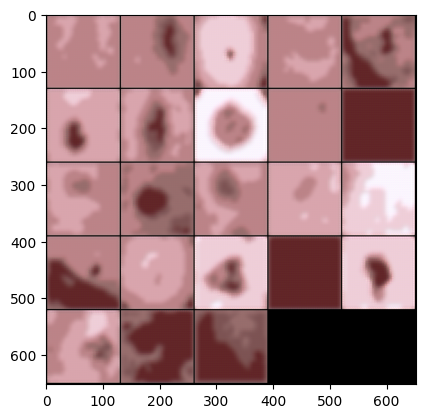

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.36it/s]


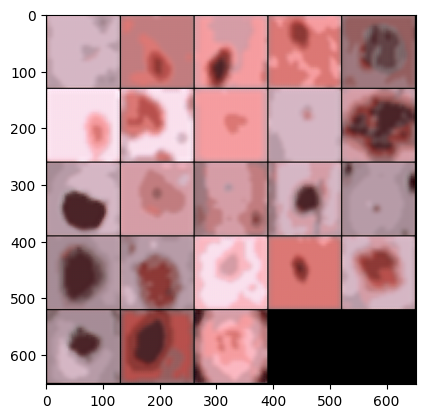

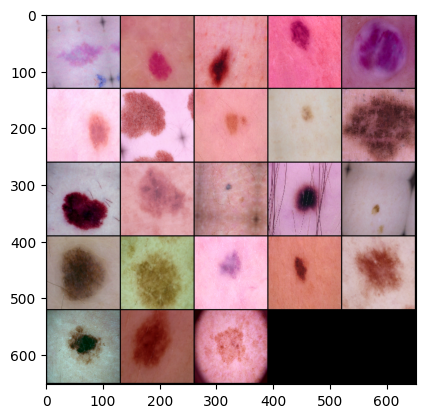

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:06<00:00,  4.22it/s]


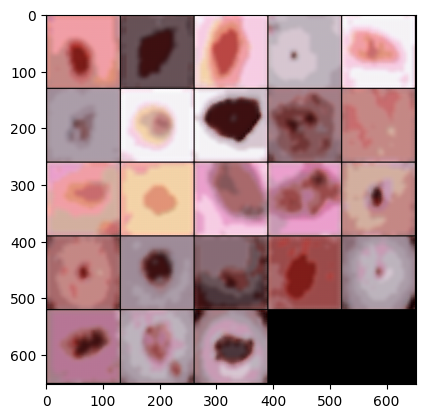

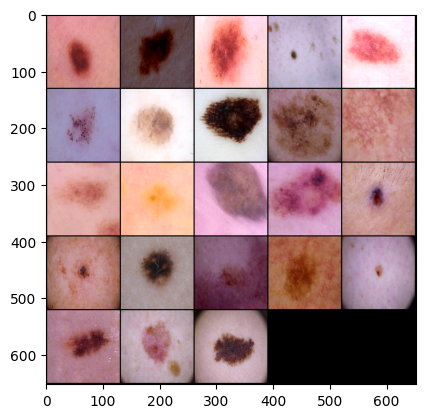

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.37it/s]


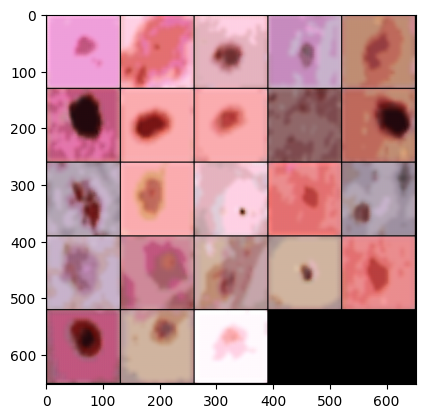

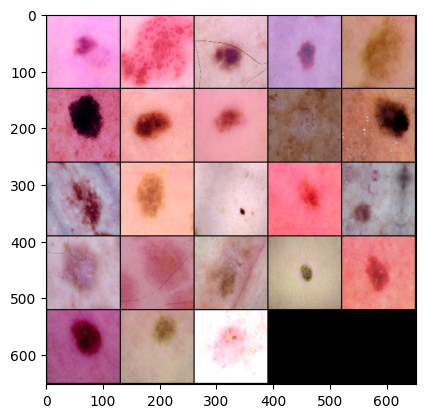

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.37it/s]


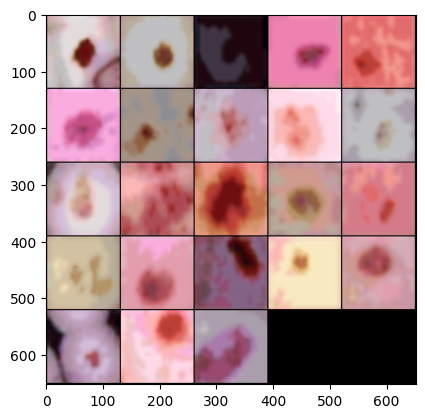

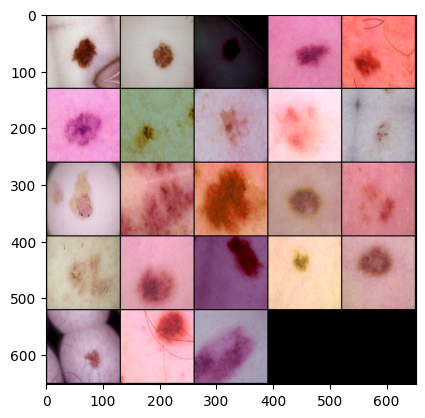

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.35it/s]


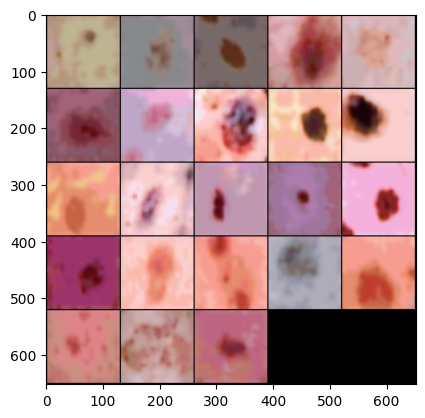

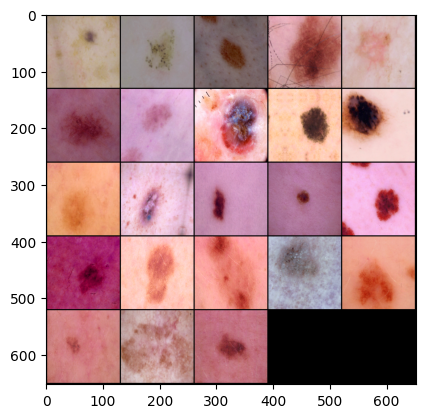

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:05<00:00,  4.33it/s]


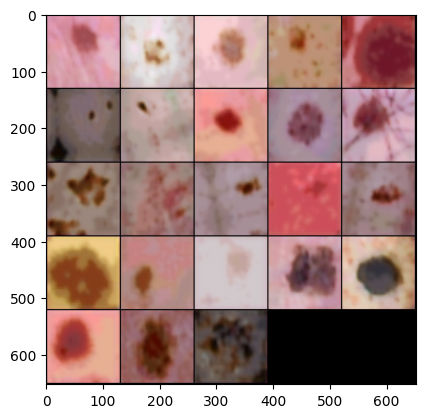

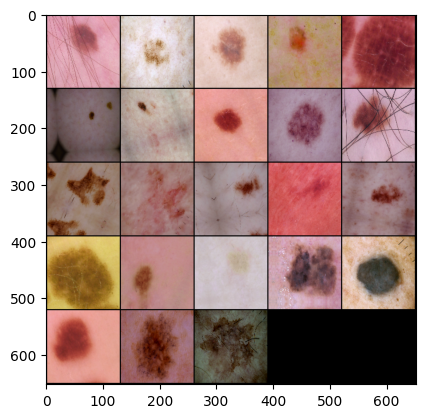

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:05<00:00,  4.32it/s]


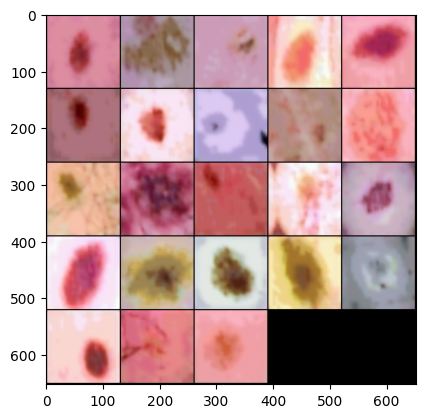

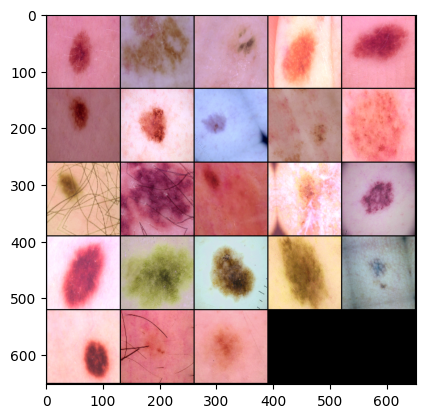

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:06<00:00,  4.22it/s]


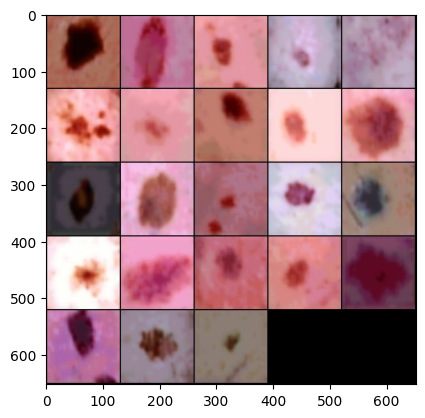

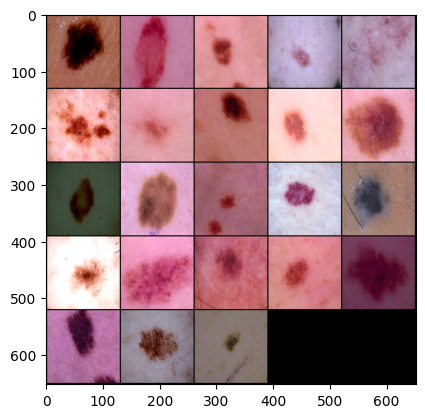

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:06<00:00,  4.21it/s]


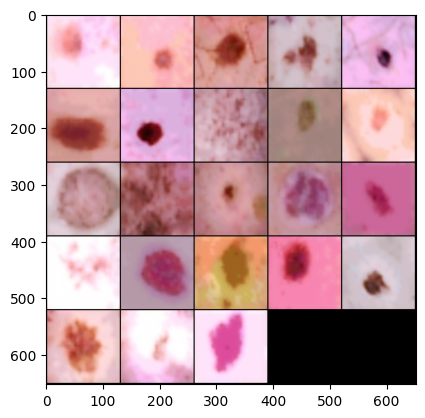

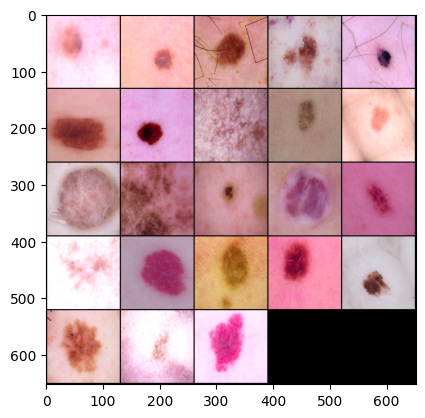

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:07<00:00,  4.17it/s]


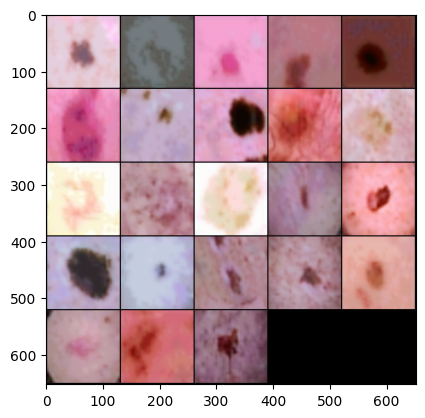

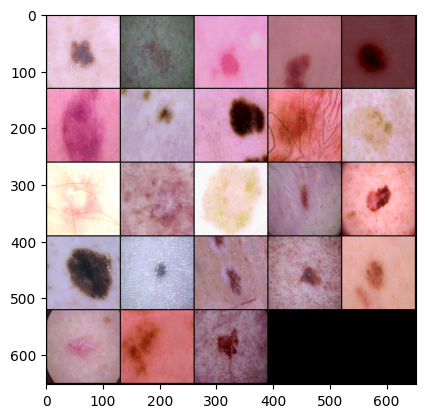

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:08<00:00,  4.14it/s]


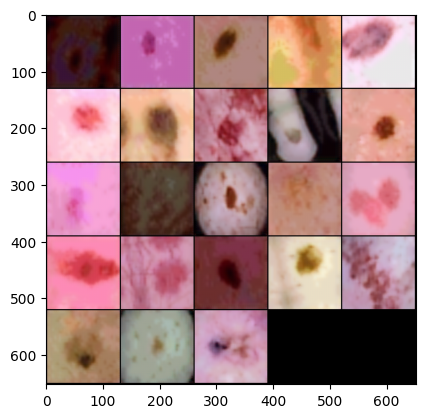

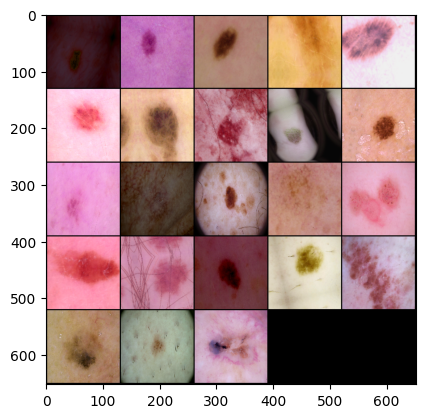

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:06<00:00,  4.22it/s]


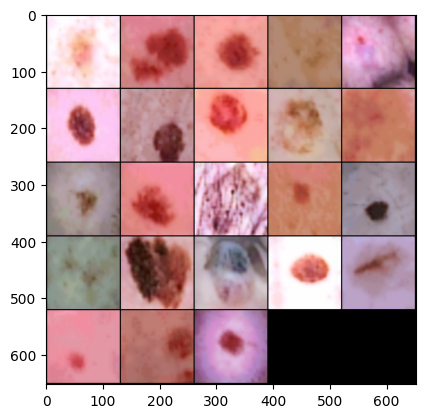

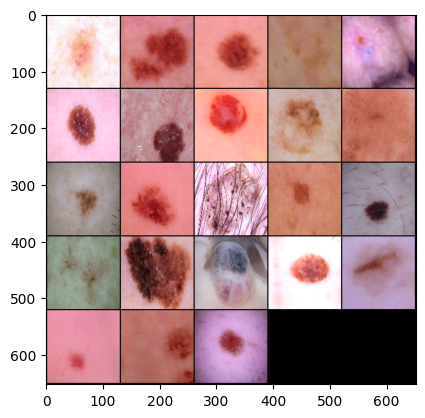

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:06<00:00,  4.21it/s]


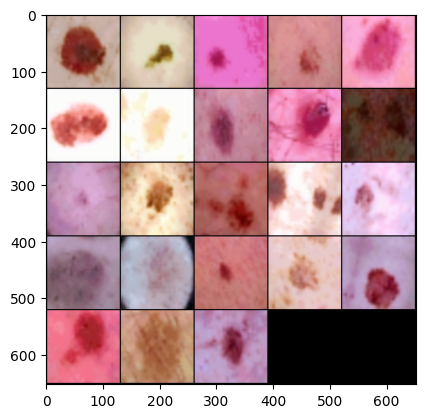

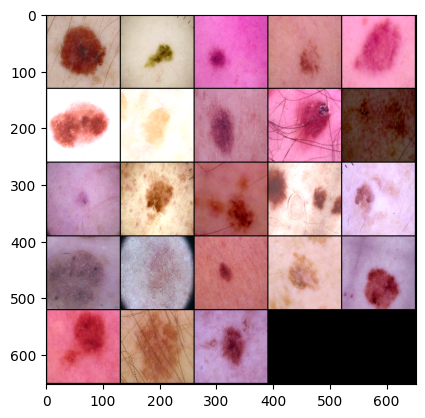

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:07<00:00,  4.20it/s]


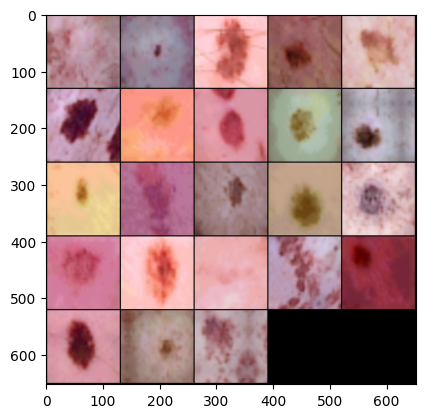

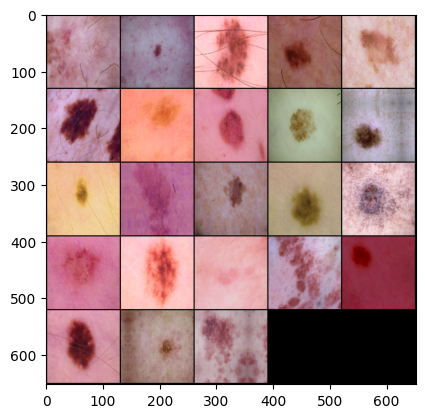

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:07<00:00,  4.20it/s]


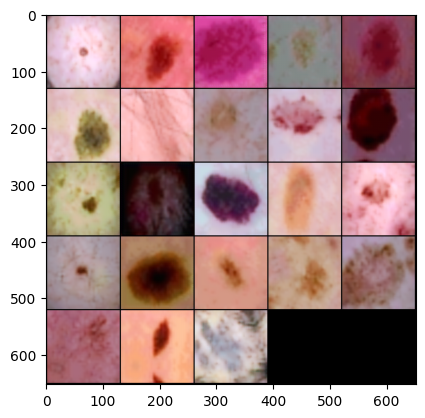

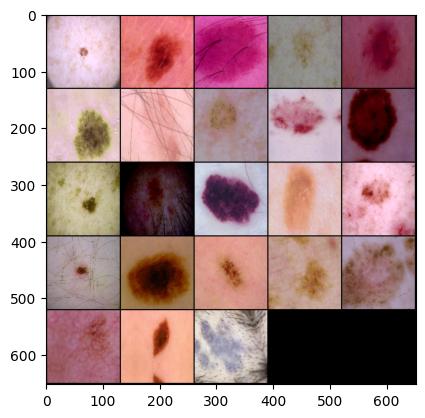

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:06<00:00,  4.22it/s]


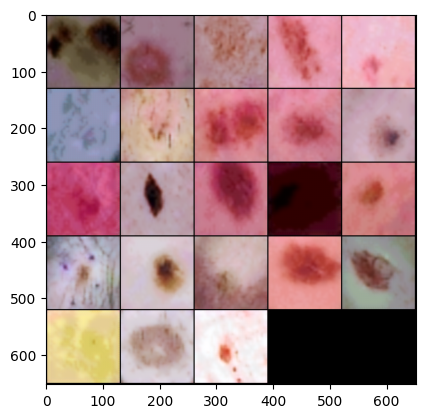

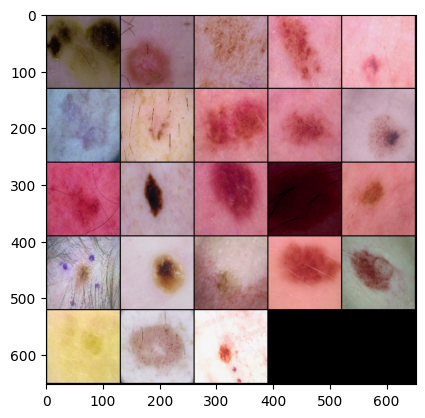

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.36it/s]


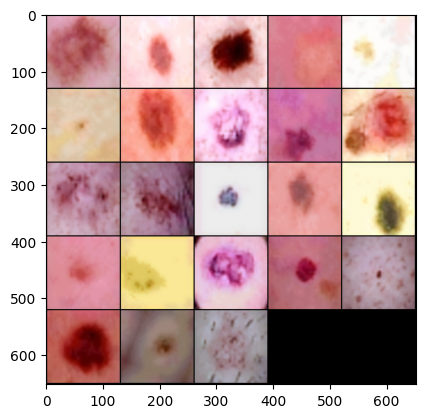

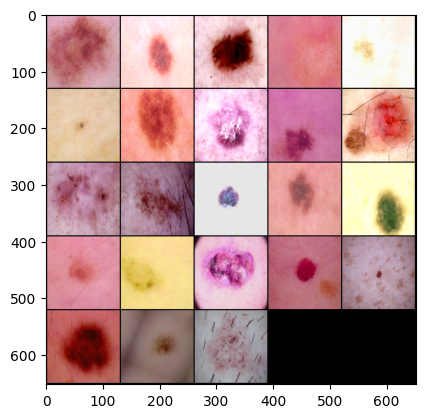

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.36it/s]


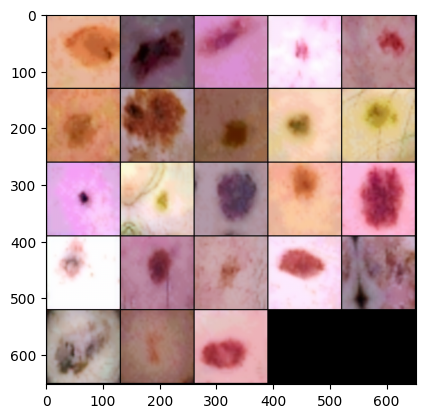

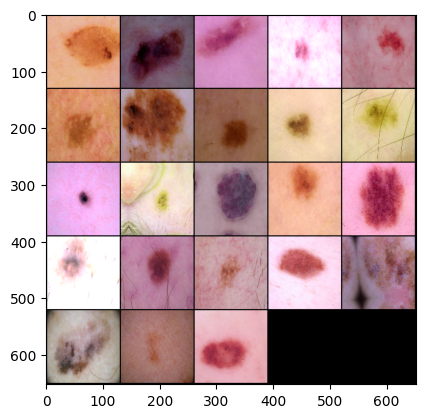

  0%|          | 0/282 [00:00<?, ?it/s]/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
100%|██████████| 282/282 [01:04<00:00,  4.40it/s]


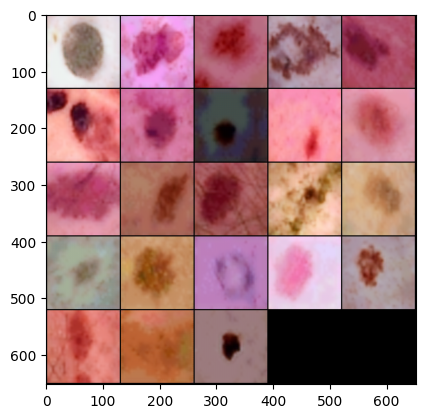

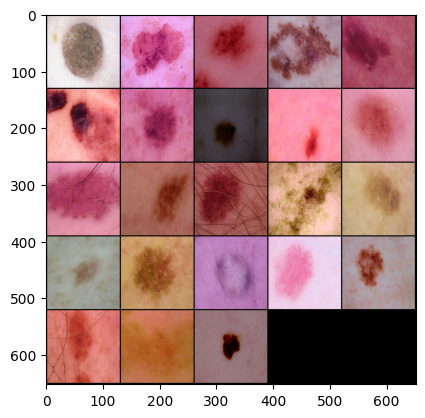

In [52]:
for epoch in range(num_epochs):
    model.train()
    for i, (image, _, _, _) in enumerate(tqdm(data_loader.train_dataloader())):
        image = image.to(DEVICE)
        optimizer.zero_grad()

        # Forward pass
        embedding_loss, x_hat, perplexity, min_encoding_indices,z_q = model(image)
        recon_loss = torch.mean((x_hat - image)**2) / 1
        loss = recon_loss + embedding_loss

        # Backward pass
        loss.backward()
        optimizer.step()

        # Append losses to the lists
        results['recon_errors'].append(recon_loss.item())
        results['perplexities'].append(perplexity.item())
        results['loss_vals'].append(embedding_loss.item())
    avg_recon_loss = np.mean(results['recon_errors'])
    avg_perplexity = np.mean(results['perplexities'])
    avg_embedding_loss = np.mean(results['loss_vals'])
    wandb.log({"Epoch": epoch, "Avg Recon Loss": avg_recon_loss, "Avg Perplexity": avg_perplexity, "Avg Embedding Loss": avg_embedding_loss})
    with torch.no_grad():
        _, x_hat, _, _ ,_= model(image)
        plot_images_from_tensor(x_hat, name="reconstructed_images")
        plot_images_from_tensor(image, name="real_images")

In [53]:
torch.save(model.state_dict(), 'vq_vae.pth')

In [56]:
latent_representations = []
model.eval()
with torch.no_grad():
    for data, _, _, _ in data_loader.train_dataloader():
        data = data.to(DEVICE)
        # Forward pass through the model
        embedding_loss, x_hat, perplexity, z_q, min_encoding_indices= model(data)
        # Collect the quantized outputs; these are your latent representations
        latent_representations.append(z_q)

# Concatenate all batch latent codes
latent_representations = torch.cat(latent_representations, dim=0)

latent_representations.shape

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


torch.Size([9015, 64, 32, 32])

In [57]:
latent_representations_np = latent_representations.cpu().numpy()

In [58]:
np.save('latent_representations', latent_representations_np)

In [66]:
test_latent_codes = []
model.eval()  # Make sure the model is in evaluation mode
with torch.no_grad():
    for test_data, _, _, _ in data_loader.test_dataloader():
        test_data = test_data.to(DEVICE)
        embedding_loss, x_hat, perplexity, z_q, min_encoding_indices = model(test_data)
        test_latent_codes.append(z_q)
test_latent_codes = torch.cat(test_latent_codes, dim=0)

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


In [67]:
test_latent_codes.shape

torch.Size([1000, 64, 32, 32])

In [68]:
test_latent_representations_np = test_latent_codes.cpu().numpy()

In [69]:
np.save('test_latent_representations', test_latent_representations_np)

In [148]:
model.eval()
images, _, _, _ = next(iter(data_loader.test_dataloader()))
images = images.to(DEVICE)

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


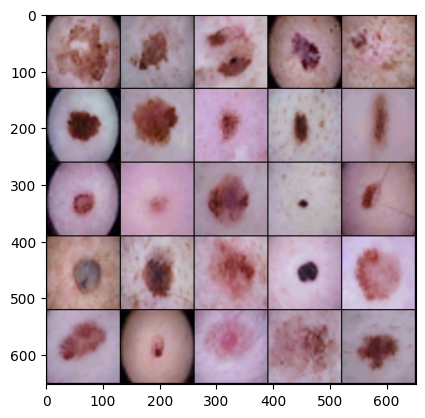

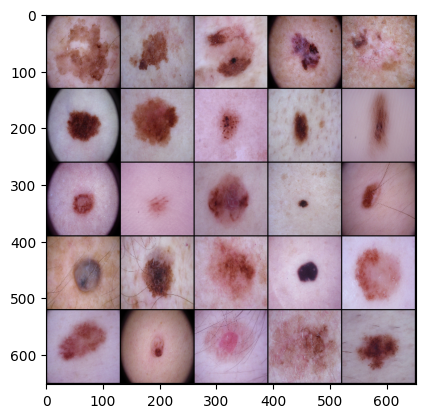

In [150]:
with torch.no_grad():
    embedding_loss, x_hat, perplexity, min_encoding_indices,z_q = model(images)
    plot_images_from_tensor(x_hat, name="reconstructed_images")
    plot_images_from_tensor(images, name="real_images")

In [124]:
latent_data_loader = DataLoader(latent_representations_np, batch_size=32)

In [126]:
x = next(iter(latent_data_loader))

In [127]:
x.shape

torch.Size([32, 64, 32, 32])

In [120]:
class GatedConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(GatedConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.gate = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        return self.conv(x) * self.sigmoid(self.gate(x))

In [121]:
class GatedCNN(nn.Module):
    def __init__(self, input_channels, hidden_dim):
        super(GatedCNN, self).__init__()
        self.gate1 = GatedConv2d(input_channels, hidden_dim, 3, padding=1)
        self.gate2 = GatedConv2d(hidden_dim, hidden_dim, 3, padding=1)
        self.final = nn.Conv2d(hidden_dim, 64, 1)  # Assuming output is an image with 3 channels

    def forward(self, x):
        x = F.relu(self.gate1(x))
        x = F.relu(self.gate2(x))
        return self.final(x)

In [132]:
gated_cnn = GatedCNN(input_channels=64, hidden_dim=64).to(DEVICE)

In [134]:
optimizer = torch.optim.Adam(gated_cnn.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

In [129]:
x = np.random.random_sample((32, 64, 32, 32))
x = torch.tensor(x).float().to(DEVICE)

# test decoder
# decoder = Decoder(40, 128, 3, 64)
model_out = gated_cnn(x)
print('Dncoder out shape:', model_out.shape)

Dncoder out shape: torch.Size([32, 64, 32, 32])


In [144]:
for epoch in range(25):
    for latent_codes in latent_data_loader:
        latent_codes = latent_codes.to(DEVICE)
        optimizer.zero_grad()
        output = gated_cnn(latent_codes)
        loss = loss_fn(output, latent_codes)
        loss.backward()
        optimizer.step()

    epoch_loss = loss.item()
    print(f"Epoch {epoch}: Loss {epoch_loss}")
    wandb.log({"gatedCNN_loss": loss.item()})

Epoch 0: Loss 9.408498954144306e-06
Epoch 1: Loss 1.7954678696696647e-05
Epoch 2: Loss 1.4066898984310683e-05
Epoch 3: Loss 1.0449160981806926e-05
Epoch 4: Loss 3.734025449375622e-05
Epoch 5: Loss 2.599612889753189e-05
Epoch 6: Loss 1.6088382835732773e-05
Epoch 7: Loss 2.20898691623006e-05
Epoch 8: Loss 1.0375448255217634e-05
Epoch 9: Loss 3.7213219911791384e-05
Epoch 10: Loss 1.050401715474436e-05
Epoch 11: Loss 8.73656608746387e-06
Epoch 12: Loss 3.2017553166951984e-05
Epoch 13: Loss 1.0929953532468062e-05
Epoch 14: Loss 1.1936444934690371e-05
Epoch 15: Loss 9.229260285792407e-06
Epoch 16: Loss 1.2080591659469064e-05
Epoch 17: Loss 1.0556469533185009e-05
Epoch 18: Loss 8.836768756737001e-06
Epoch 19: Loss 6.792156000301475e-06
Epoch 20: Loss 1.221228467329638e-05
Epoch 21: Loss 8.3183404058218e-06
Epoch 22: Loss 1.0635256330715492e-05
Epoch 23: Loss 9.390059858560562e-06
Epoch 24: Loss 1.781938408385031e-05


In [146]:
gated_cnn.eval()
images, _, _, _ = next(iter(data_loader.test_dataloader()))
images = images.to(DEVICE)

/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/716659525.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


In [143]:
torch.save(gated_cnn.state_dict(), 'gated_cnn.pth')

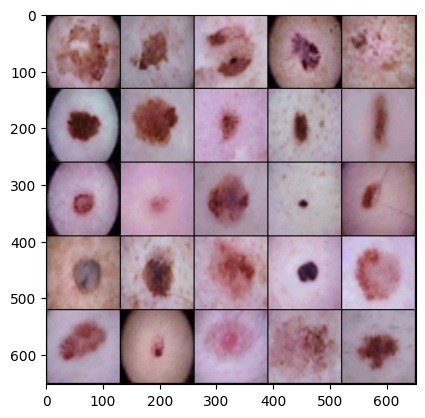

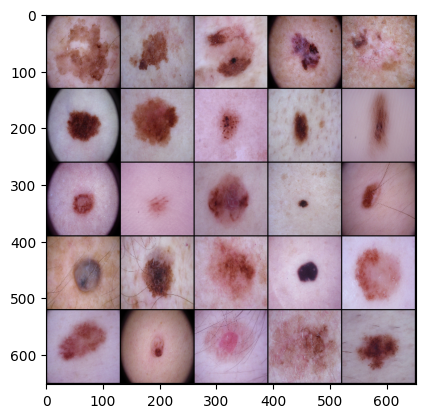

In [147]:
with torch.no_grad():
    z_e = model.encoder(images)
    z_e = model.pre_quantization_conv(z_e)
    embedding_loss, z_q, perplexity, _, min_encoding_indices = model.vector_quantization(z_e)
    z_q = gated_cnn(z_q)
    reconstructions = model.decoder(z_q)
    plot_images_from_tensor(reconstructions, name="reconstructed_images")
    plot_images_from_tensor(images, name="real_images")

In [274]:
class CausalConv2d(nn.Conv2d):


    def __init__(self, mask_center, *args, **kwargs):
        super().__init__(*args, **kwargs)
        i, o, h, w = self.weight.shape
        mask = torch.zeros((i, o, h, w))
        mask.data[:, :, : h // 2, :] = 1
        mask.data[:, :, h // 2, : w // 2 + int(not mask_center)] = 1
        self.register_buffer("mask", mask)

    def forward(self, x):
        self.weight.data *= self.mask
        return super().forward(x)

In [276]:
class CausalResidualBlock(nn.Module):

    def __init__(self, n_channels):
        super().__init__()
        self._net = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(
                in_channels=n_channels, out_channels=n_channels // 2, kernel_size=1
            ),
            nn.ReLU(),
            CausalConv2d(
                mask_center=False,
                in_channels=n_channels // 2,
                out_channels=n_channels // 2,
                kernel_size=3,
                padding=1,
            ),
            nn.ReLU(),
            nn.Conv2d(
                in_channels=n_channels // 2, out_channels=n_channels, kernel_size=1
            ),
        )

    def forward(self, x):
        return x + self._net(x)

In [277]:
class PixelCNN(nn.Module):
    """The PixelCNN model."""

    def __init__(
        self,
        in_channels=3,
        out_channels=3,
        n_residual=15,
        residual_channels=128,
        head_channels=32,
        sample_fn=None,
    ):

        super().__init__()
        self._input = CausalConv2d(
            mask_center=True,
            in_channels=in_channels,
            out_channels=2 * residual_channels,
            kernel_size=7,
            padding=3,
        )
        self._causal_layers = nn.ModuleList(
            [
                CausalResidualBlock(n_channels=2 * residual_channels)
                for _ in range(n_residual)
            ]
        )
        self._head = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(
                in_channels=2 * residual_channels,
                out_channels=head_channels,
                kernel_size=1,
            ),
            nn.ReLU(),
            nn.Conv2d(
                in_channels=head_channels, out_channels=out_channels, kernel_size=1
            ),
        )

    def forward(self, x):
        x = self._input(x)
        for layer in self._causal_layers:
            x = x + layer(x)
        return self._head(x)

In [279]:
pixelcnn = PixelCNN(
    in_channels=64,
    out_channels=64,
    n_residual=15,
    residual_channels=64,
    head_channels=32
).to(DEVICE)

In [280]:
optimizer = torch.optim.Adam(pixelcnn.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

In [283]:
for epoch in range(20):
    for latent_codes in DataLoader(latent_representations, batch_size=32):
        latent_codes = latent_codes.to(DEVICE)
        optimizer.zero_grad()
        output = pixelcnn(latent_codes)
        loss = loss_fn(output, latent_codes)
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch}: Loss {loss.item()}")
    wandb.log({"pixelCNN_loss": loss.item()})

Epoch 0: Loss 0.04960526153445244
Epoch 1: Loss 0.04818906635046005
Epoch 2: Loss 0.04661921411752701
Epoch 3: Loss 0.044929780066013336
Epoch 4: Loss 0.043158676475286484
Epoch 5: Loss 0.041347749531269073
Epoch 6: Loss 0.03954188898205757
Epoch 7: Loss 0.03778725489974022
Epoch 8: Loss 0.03612883761525154
Epoch 9: Loss 0.03460736572742462
Epoch 10: Loss 0.03325609490275383
Epoch 11: Loss 0.03209790959954262
Epoch 12: Loss 0.031143268570303917
Epoch 13: Loss 0.030389564111828804
Epoch 14: Loss 0.029822135344147682
Epoch 15: Loss 0.029416915029287338
Epoch 16: Loss 0.029144147410988808
Epoch 17: Loss 0.028972486034035683
Epoch 18: Loss 0.028872666880488396
Epoch 19: Loss 0.028820008039474487


In [284]:
torch.save(pixelcnn.state_dict(), 'pixel_cnn.pth')

In [290]:
pixelcnn.eval()
images, _, _, _ = next(iter(data_loader.test_dataloader()))
images = images.to(DEVICE)

/tmp/ipykernel_34/3806081156.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)
/tmp/ipykernel_34/3806081156.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = torch.tensor(self.data_frame.iloc[idx, 1:], dtype=torch.float32)


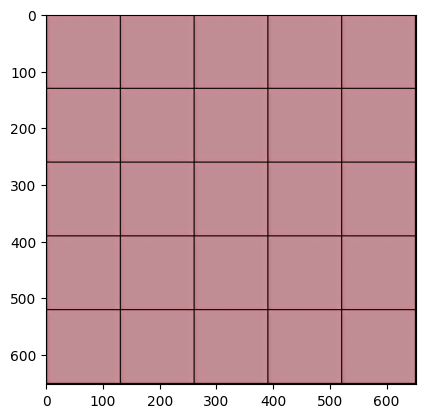

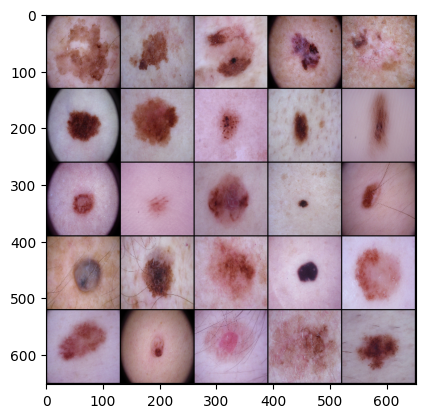

In [291]:
with torch.no_grad():
    z_e = model.encoder(images)
    z_e = model.pre_quantization_conv(z_e)
    embedding_loss, z_q, perplexity, _, min_encoding_indices = model.vector_quantization(z_e)
    z_q = pixelcnn(z_q)
    reconstructions = model.decoder(z_q)
    plot_images_from_tensor(reconstructions, name="reconstructed_images")
    plot_images_from_tensor(images, name="real_images")

In [ ]:
import torch
import torch.nn as nn

class PixelConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(PixelConvLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        out = self.conv(x)
        out = self.relu(out)
        return out

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        out += residual
        out = self.relu(out)
        return out

class PixelCNN(nn.Module):
    def __init__(self):
        super(PixelCNN, self).__init__()
        self.pixel_conv_layer = PixelConvLayer(in_channels=128, out_channels=256)
        self.residual_blocks = nn.Sequential(
            ResidualBlock(channels=256),
            ResidualBlock(channels=256),
            ResidualBlock(channels=256),
            ResidualBlock(channels=256),
            ResidualBlock(channels=256)
        )
        self.pixel_conv_layer_6 = PixelConvLayer(in_channels=256, out_channels=128)
        self.pixel_conv_layer_7 = PixelConvLayer(in_channels=128, out_channels=128)
        self.conv2d_18 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=1)

    def forward(self, x):
        out = self.pixel_conv_layer(x)
        out = self.residual_blocks(out)
        out = self.pixel_conv_layer_6(out)
        out = self.pixel_conv_layer_7(out)
        out = self.conv2d_18(out)
        return out

